In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch

import os
import sys
from watermark  import watermark

sys.path.insert(0, os.path.abspath('..'))

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# %matplotlib widget

### Task 1 :  Preprocessing the Time-Series Data 

#### Load the HAR dataset

In [2]:
import os
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler

base_path = 'human+activity+recognition+using+smartphones/UCI HAR Dataset/UCI HAR Dataset'
train_path = 'train/inertial_signals'

y_train = pd.read_csv(os.path.join(base_path, 'train/y_train.txt'), header=None)
print("Original y_train shape:", y_train.shape)
y_train = np.array(y_train).reshape(-1)
print("Reshaped y_train shape:", y_train.shape)

acc_x = pd.read_csv(os.path.join(base_path, train_path, 'total_acc_x_train.txt'),
                    header=None, delim_whitespace=True)
acc_y = pd.read_csv(os.path.join(base_path, train_path, 'total_acc_y_train.txt'),
                    header=None, delim_whitespace=True)
acc_z = pd.read_csv(os.path.join(base_path, train_path, 'total_acc_z_train.txt'),
                    header=None, delim_whitespace=True)
print("Original data shapes:", acc_x.shape, acc_y.shape, acc_z.shape)

# Convert DataFrames to NumPy arrays (if needed)
acc_x = acc_x.values
acc_y = acc_y.values
acc_z = acc_z.values

# Standardize each signal column-wise (i.e., across samples for each time step)
# scaler_x = StandardScaler()
# scaler_y = StandardScaler()
# scaler_z = StandardScaler()

# acc_x = scaler_x.fit_transform(acc_x)
# acc_y = scaler_y.fit_transform(acc_y)
# acc_z = scaler_z.fit_transform(acc_z)

# convert to dataframes
acc_x = pd.DataFrame(acc_x)
acc_y = pd.DataFrame(acc_y)
acc_z = pd.DataFrame(acc_z)

print("Standardized data shapes:", 
      acc_x.shape, acc_y.shape, acc_z.shape)


Original y_train shape: (7352, 1)
Reshaped y_train shape: (7352,)


C:\Users\Soham\AppData\Local\Temp\ipykernel_7712\1298666926.py:14: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  acc_x = pd.read_csv(os.path.join(base_path, train_path, 'total_acc_x_train.txt'),
C:\Users\Soham\AppData\Local\Temp\ipykernel_7712\1298666926.py:16: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  acc_y = pd.read_csv(os.path.join(base_path, train_path, 'total_acc_y_train.txt'),
C:\Users\Soham\AppData\Local\Temp\ipykernel_7712\1298666926.py:18: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  acc_z = pd.read_csv(os.path.join(base_path, train_path, 'total_acc_z_train.txt'),


Original data shapes: (7352, 128) (7352, 128) (7352, 128)
Standardized data shapes: (7352, 128) (7352, 128) (7352, 128)


In [3]:
# count number of y labels
y_train_counts = pd.Series(y_train).value_counts()
print(y_train_counts)

6    1407
5    1374
4    1286
1    1226
2    1073
3     986
Name: count, dtype: int64


In [4]:
# n_samples = 500
# sample_indices = []

# # For each class (assumed classes 1 through 6)
# for i in range(1, 7):
#     indices = np.where(y_train == i)[0][:n_samples]
#     sample_indices.append(indices)
# sample_indices = np.concatenate(sample_indices)
# print("Sample indices shape:", sample_indices.shape)

# # Filter y_train and signals based on sample_indices
# y_train = y_train[sample_indices]
# acc_x = acc_x.iloc[sample_indices, :]
# acc_y = acc_y.iloc[sample_indices, :]
# acc_z = acc_z.iloc[sample_indices, :]

# print("Filtered y_train shape:", y_train.shape)
# print("Filtered signals shapes:", acc_x.shape, acc_y.shape, acc_z.shape)

78
150
125
27
0
51


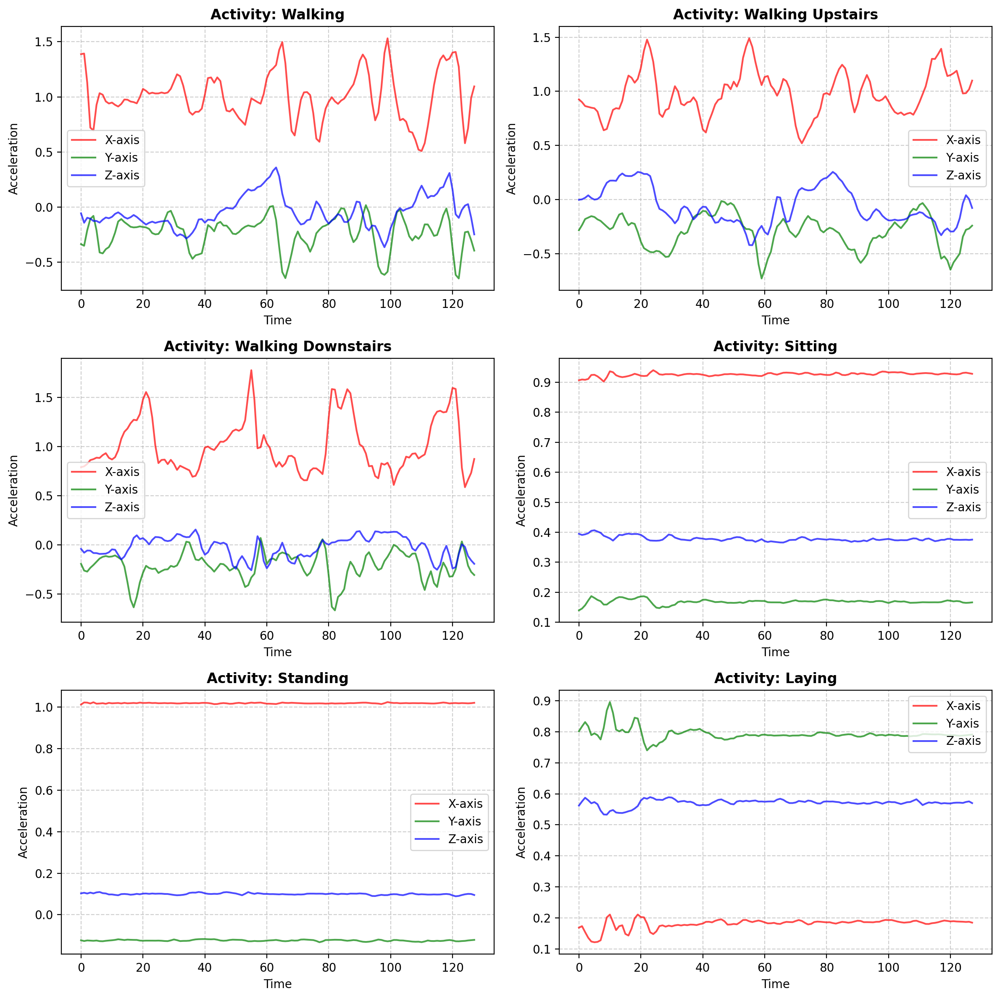

In [5]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
axes = axes.ravel()

activity_labels = {1: 'Walking', 2: 'Walking Upstairs', 3: 'Walking Downstairs', 4: 'Sitting', 5: 'Standing', 6: 'Laying'}

for i in range(6):
    indices = np.where(y_train == i+1)[0]
    if len(indices) == 0:
        continue
    sample_index = indices[0] 
    print(sample_index)
    
    axes[i].plot(acc_x.iloc[sample_index], label='X-axis', color='r', alpha=0.7)
    axes[i].plot(acc_y.iloc[sample_index], label='Y-axis', color='g', alpha=0.7)
    axes[i].plot(acc_z.iloc[sample_index], label='Z-axis', color='b', alpha=0.7)
    axes[i].set_title(f'Activity: {activity_labels.get(i+1, "Unknown")}', fontsize=12, fontweight='bold')
    axes[i].legend()
    axes[i].set_xlabel('Time', fontsize=10)
    axes[i].set_ylabel('Acceleration', fontsize=10)
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Adjust layout
plt.tight_layout()
plt.show()

#### Segment the time series subsample the data

In [6]:
import os
import pickle
import matplotlib.pyplot as plt
from tqdm import tqdm  # Import tqdm

window_size = 5  
subsample_factor = 2  
save_folder = "processed_signals"
os.makedirs(save_folder, exist_ok=True)

recompute = True

# the data is already segmented into windows of 128 samples, so we can directly use the data as is.

def process_and_save(df, axis_name, apply_moving_average=False):
    processed_signals = []
    for i in tqdm(range(len(df)), desc=f"Processing {axis_name}"):  # tqdm for progress tracking
        original = df.iloc[i, :]

        if apply_moving_average:
            smoothed = original.rolling(window=window_size, center=True).mean()
            subsampled = smoothed.iloc[::subsample_factor].dropna()
        else:
            subsampled = original.iloc[::subsample_factor].dropna()

        processed_signals.append(subsampled.values)  

    with open(os.path.join(save_folder, f"{axis_name}.pkl"), "wb") as f:
        pickle.dump(processed_signals, f)
    return processed_signals  

if recompute:
    x_signals = process_and_save(acc_x, "acc_x")
    y_signals = process_and_save(acc_y, "acc_y")
    z_signals = process_and_save(acc_z, "acc_z")

else:
    with open(os.path.join(save_folder, "acc_x.pkl"), "rb") as f:
        x_signals = pickle.load(f)
    with open(os.path.join(save_folder, "acc_y.pkl"), "rb") as f:
        y_signals = pickle.load(f)
    with open(os.path.join(save_folder, "acc_z.pkl"), "rb") as f:
        z_signals = pickle.load(f)

print(len(x_signals), len(y_signals), len(z_signals))
print(x_signals[0].shape, y_signals[0].shape, z_signals[0].shape) 

Processing acc_z: 100%|██████████| 7352/7352 [00:00<00:00, 8932.95it/s]

7352 7352 7352
(64,) (64,) (64,)


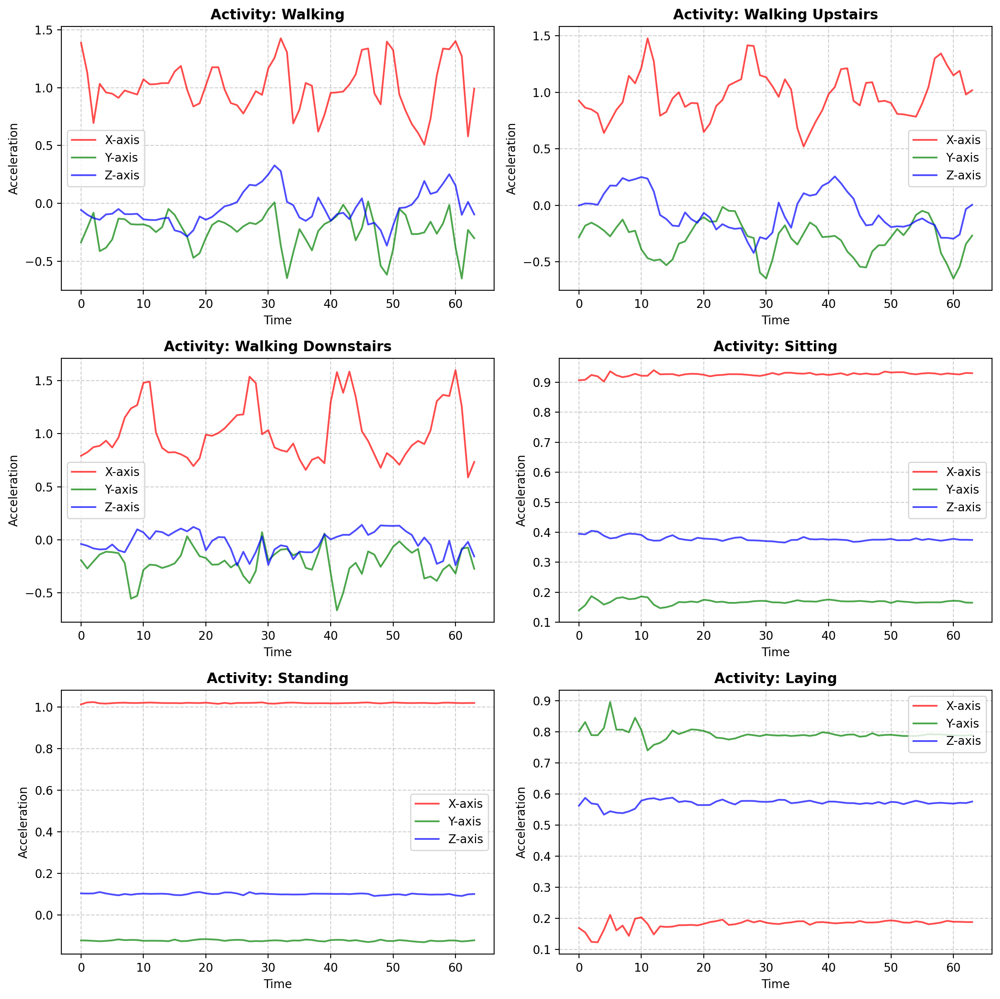

In [7]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
axes = axes.ravel()
for i in range(6):
    indices = np.where(y_train == i+1)[0]
    if len(indices) == 0:
        continue
    sample_index = indices[0]     
    axes[i].plot(x_signals[sample_index], label='X-axis', color='r', alpha=0.7)
    axes[i].plot(y_signals[sample_index], label='Y-axis', color='g', alpha=0.7)
    axes[i].plot(z_signals[sample_index], label='Z-axis', color='b', alpha=0.7)
    axes[i].set_title(f'Activity: {activity_labels.get(i+1, "Unknown")}', fontsize=12, fontweight='bold')
    axes[i].legend()
    axes[i].set_xlabel('Time', fontsize=10)
    axes[i].set_ylabel('Acceleration', fontsize=10)
    axes[i].grid(True, linestyle='--', alpha=0.6)

# Adjust layout
plt.tight_layout()
plt.show()

#### Dynamic Time Warping (DTW)

In [8]:
x_signals = [ np.array(signal) for signal in x_signals]
y_signals = [ np.array(signal) for signal in y_signals]
z_signals = [ np.array(signal) for signal in z_signals]

print(len(x_signals), len(y_signals), len(z_signals))
print(x_signals[0].shape, y_signals[0].shape, z_signals[0].shape)

signals = np.stack((x_signals, y_signals, z_signals), axis=-1)  # Shape: (n_samples, n_features, 3)
print("Signals shape:", signals.shape)

7352 7352 7352
(64,) (64,) (64,)
Signals shape: (7352, 64, 3)


In [9]:
from dtaidistance import dtw_ndim
import tqdm

recompute = False

if os.path.exists("dtw_dist_matrix.npy") and not recompute:
    dtw_dist_matrix = np.load("dtw_dist_matrix.npy")
else:
    dtw_dist_matrix = dtw_ndim.distance_matrix_fast(signals)
    np.save("dtw_dist_matrix.npy", dtw_dist_matrix)
    
print("DTW Distance Matrix shape:", dtw_dist_matrix.shape)

DTW Distance Matrix shape: (7352, 7352)


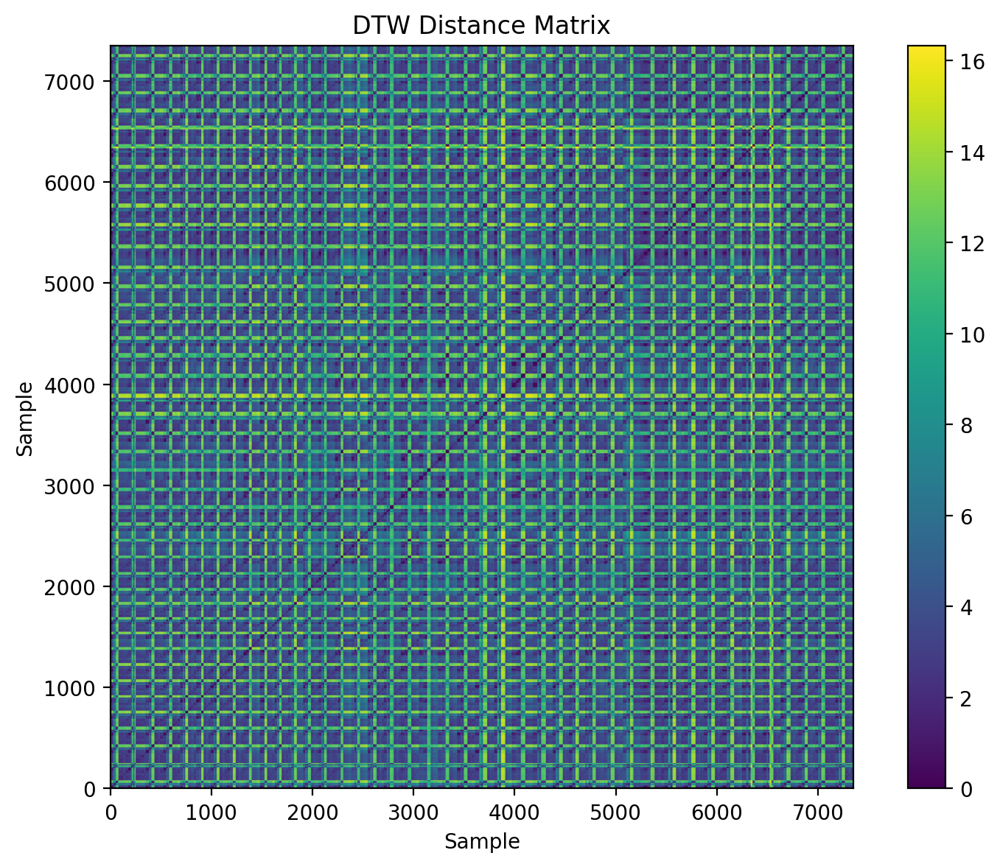

In [10]:
plt.figure(figsize=(8, 6))
plt.imshow(dtw_dist_matrix, cmap='viridis', origin='lower')
plt.colorbar()
plt.title("DTW Distance Matrix")
plt.xlabel("Sample")
plt.ylabel("Sample")
plt.tight_layout()
plt.show()

#### Euclidean distance

$$d(x, y) = \sqrt{\sum_{i=1}^{n} (x_i - y_i)^2}$$

In [11]:
from tqdm import tqdm

n_samples = signals.shape[0]
euclidean_dist_matrix = np.zeros((n_samples, n_samples)) 

recompute = False
if os.path.exists("euclidean_dist_matrix.npy") and not recompute:
    euclidean_dist_matrix = np.load("euclidean_dist_matrix.npy")
else:
    for i in tqdm(range(n_samples), desc="Computing distances"):
        for j in range(i + 1, n_samples):  # Only compute upper triangle (symmetry)
            euclidean_dist_matrix[i, j] = np.linalg.norm(signals[i] - signals[j])
            euclidean_dist_matrix[j, i] = euclidean_dist_matrix[i, j]  # Symmetric matrix

    print(euclidean_dist_matrix.shape)
    np.save("euclidean_dist_matrix.npy", euclidean_dist_matrix)

Computing distances: 100%|██████████| 7352/7352 [02:29<00:00, 49.21it/s] 


(7352, 7352)


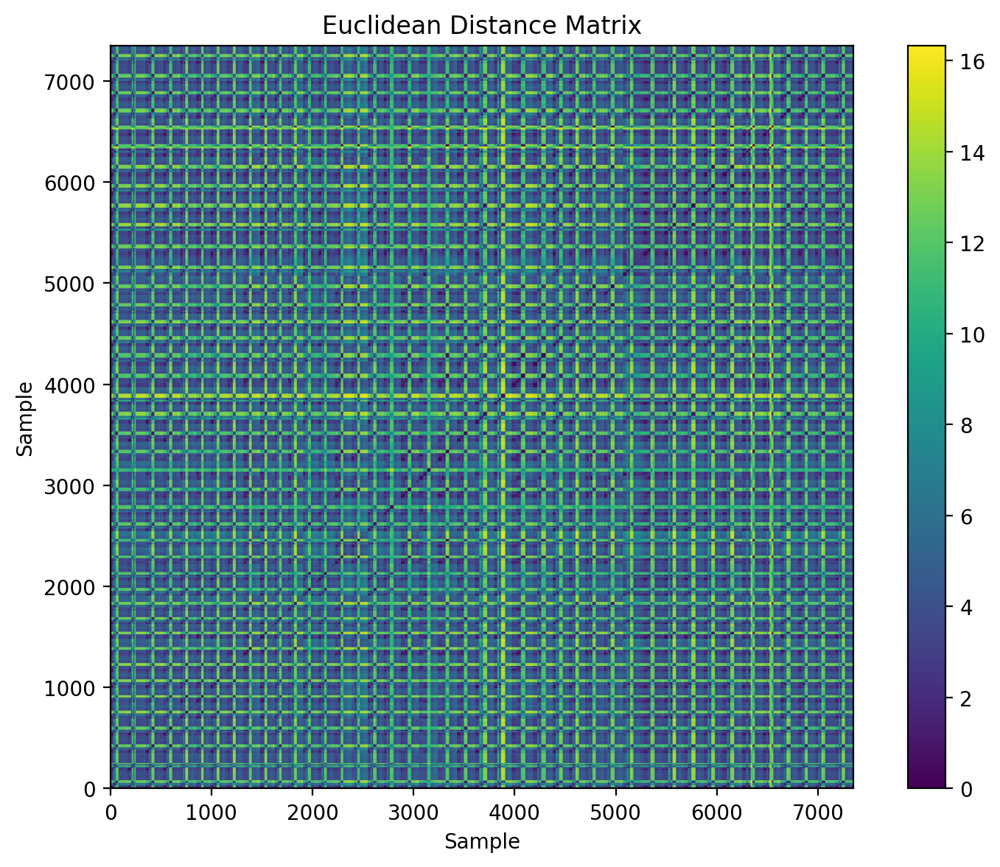

In [12]:
plt.figure(figsize=(8, 6))
plt.imshow(euclidean_dist_matrix, cmap='viridis', origin='lower')
plt.colorbar()
plt.title("Euclidean Distance Matrix")
plt.xlabel("Sample")
plt.ylabel("Sample")
plt.tight_layout()
plt.show()

### Task 2 :  Apply Diffusion Maps for Dimensionality Reduction

#### Diffusion Kernel

$$ K_{t} = e^{-\frac{d_{t}^{2}}{\epsilon}} $$

Constructing Diffusion Kernel: 100%|██████████| 7352/7352 [01:57<00:00, 62.82it/s]


(7352, 7352)


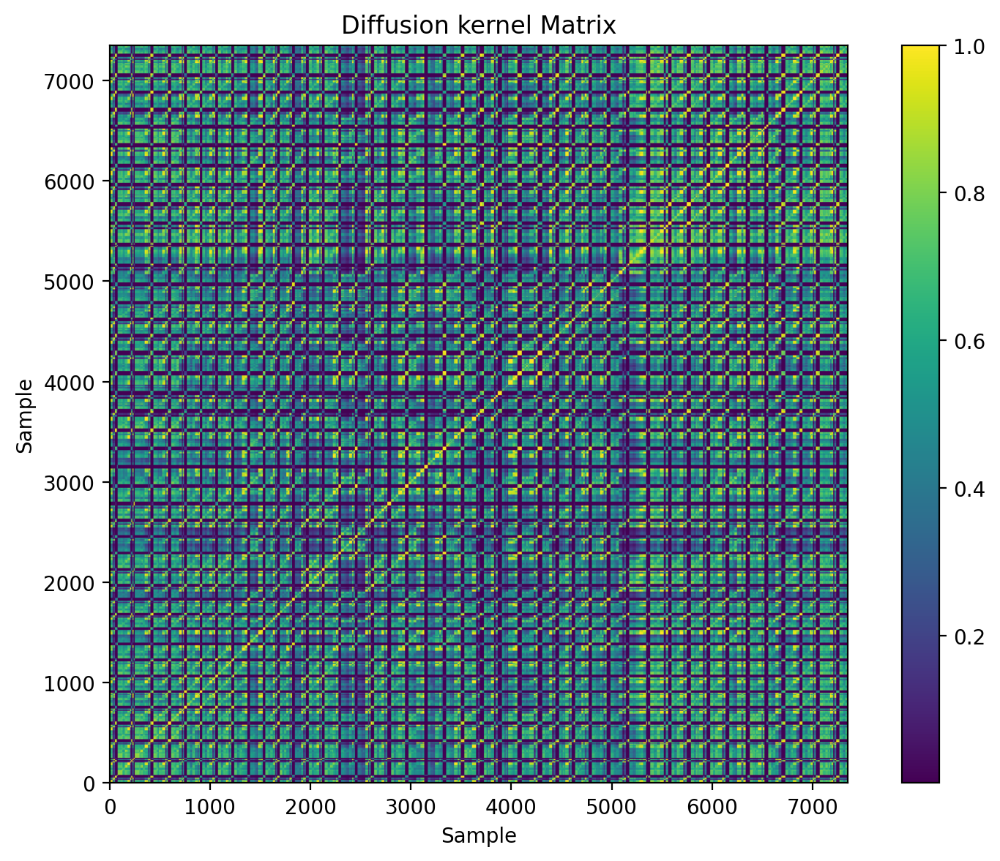

In [13]:
from scipy.linalg import eigh 
from tqdm import tqdm

def construct_diffusion_kernel(dtw_dist_matrix, epsilon):
    """
    Constructs the diffusion kernel matrix.
    K_ij = exp(-d(x_i, x_j)^2 / epsilon)
    """
    n_samples = dtw_dist_matrix.shape[0]
    diffusion_kernel = np.zeros((n_samples, n_samples))
    
    for i in tqdm(range(n_samples), desc="Constructing Diffusion Kernel"):
        for j in range(n_samples):
            diffusion_kernel[i, j] = np.exp(-dtw_dist_matrix[i, j]**2 / epsilon)
    
    return diffusion_kernel

retrain = False
if os.path.exists("diffusion_kernel.npy") and not retrain:
    diffusion_kernel = np.load("diffusion_kernel.npy")
else:
    epsilon = np.median(dtw_dist_matrix)**2
    diffusion_kernel = construct_diffusion_kernel(dtw_dist_matrix, epsilon)
    np.save("diffusion_kernel.npy", diffusion_kernel)

print(diffusion_kernel.shape)

plt.figure(figsize=(8, 6))
plt.imshow(diffusion_kernel, cmap='viridis', origin='lower')
plt.colorbar()
plt.title("Diffusion kernel Matrix")
plt.xlabel("Sample")
plt.ylabel("Sample")
plt.tight_layout()
plt.show()

#### Normalized Diffusion Kernel

Normalized Operator Shape: (7352, 7352)


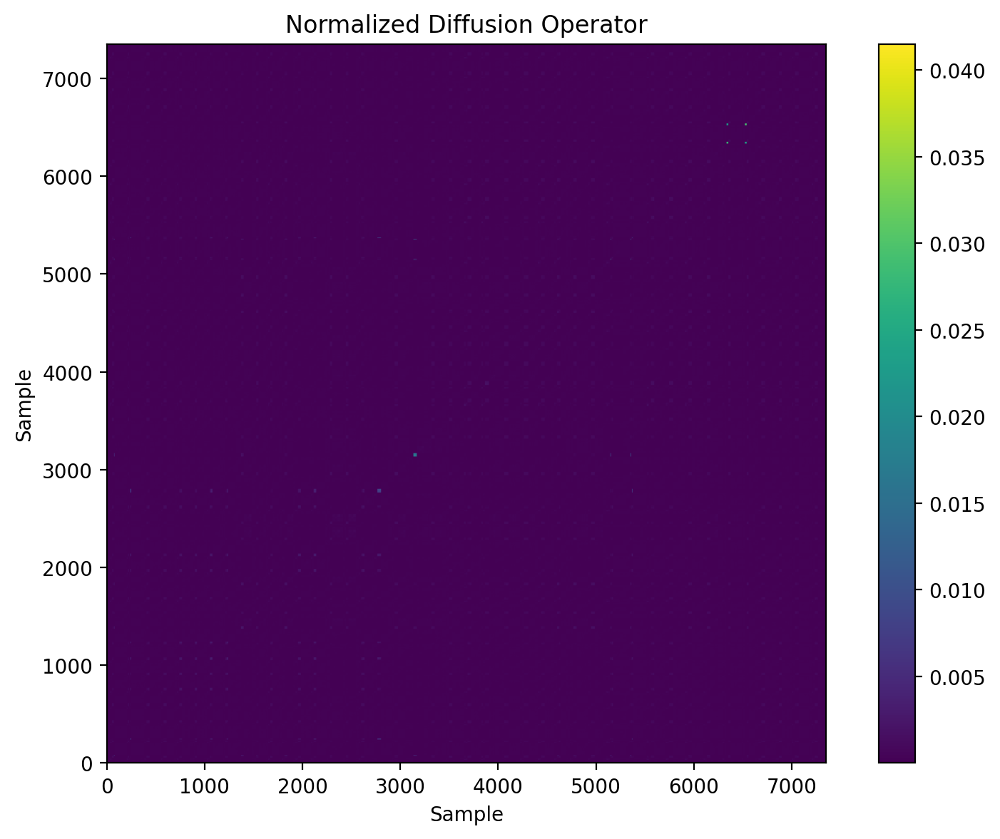

In [14]:
def compute_normalized_diffusion_operator(diffusion_kernel, alpha=0.5):

    # Compute the degree matrix from the original kernel.
    degree_matrix = np.diag(np.sum(diffusion_kernel, axis=1))
    
    # Compute D^(-alpha)
    d_inv_alpha = np.diag(np.power(np.diag(degree_matrix), -alpha))
    
    # Compute the normalized kernel: L^(alpha)
    new_kernel = d_inv_alpha @ diffusion_kernel @ d_inv_alpha
    
    # Compute D^(alpha): the degree matrix of the new kernel (row sums)
    D_alpha = np.diag(np.sum(new_kernel, axis=1))
    
    # Form the normalized diffusion operator: M = D_alpha^(-1) * new_kernel
    normalized_operator = np.linalg.inv(D_alpha) @ new_kernel
    
    return normalized_operator

normalized_operator = compute_normalized_diffusion_operator(diffusion_kernel, alpha=0.5)
print("Normalized Operator Shape:", normalized_operator.shape)

plt.figure(figsize=(8, 6))
plt.imshow(normalized_operator, cmap='viridis', origin='lower')
plt.colorbar()
plt.title("Normalized Diffusion Operator")
plt.xlabel("Sample")
plt.ylabel("Sample")
plt.tight_layout()
plt.show()

#### Diffusion Maps

In [35]:
def compute_diffusion_map(normalized_operator, num_coordinates=3, diffusion_time=1 ,remove_first = False):

    # Compute eigen decomposition
    eigenvalues, eigenvectors = eigh(normalized_operator)
    
    # Sort eigenvalues and eigenvectors in descending order (largest first)
    idx = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:, idx]
    
    print("Eigenvalues (top 50):", eigenvalues[:50])
    
    # Ignore the first trivial eigenvector (assumed to correspond to eigenvalue ~1)
    if remove_first:
        valid_eigenvalues = eigenvalues[1:num_coordinates+1]
        valid_eigenvectors = eigenvectors[:, 1:num_coordinates+1]
    else:
        valid_eigenvalues = eigenvalues[:num_coordinates]
        valid_eigenvectors = eigenvectors[:, :num_coordinates]
    
    # Scale each eigenvector by its eigenvalue raised to the power diffusion_time
    diffusion_embedding = valid_eigenvectors * (valid_eigenvalues ** diffusion_time)    
    return diffusion_embedding , valid_eigenvalues , valid_eigenvectors

diffusion_coordinates , eigenvalues, eigenvectors = compute_diffusion_map(normalized_operator, num_coordinates=3, diffusion_time=1 )
print("Diffusion Coordinates Shape:", diffusion_coordinates.shape)
print("Eigenvalues Shape:", eigenvalues.shape)
print("Diffusion Map Shape:", diffusion_coordinates.shape)

Eigenvalues (top 50): [0.99729488 0.95679471 0.95491238 0.68323819 0.56662393 0.33085985
 0.28404991 0.17206548 0.13311709 0.12454368 0.108778   0.10164355
 0.08475935 0.06999666 0.04987112 0.04785064 0.03674839 0.03407686
 0.03235443 0.0302042  0.02205615 0.02087267 0.01936336 0.01841239
 0.01713024 0.01450035 0.01435716 0.01281457 0.01270447 0.01185935
 0.01124338 0.01091248 0.00999452 0.00991142 0.00964709 0.00954107
 0.00902549 0.00876988 0.00790743 0.00741238 0.00730613 0.00713739
 0.00669513 0.00654741 0.00636214 0.0062775  0.0060984  0.00580254
 0.00558012 0.00545218]
Diffusion Coordinates Shape: (7352, 3)
Eigenvalues Shape: (3,)
Diffusion Map Shape: (7352, 3)


In [ ]:

# diffusion_coordinates , eigenvalues, eigenvectors = compute_diffusion_map(normalized_operator, num_coordinates=3, diffusion_time=1 ,remove_first=True)
# print("Diffusion Coordinates Shape:", diffusion_coordinates.shape)
# print("Eigenvalues Shape:", eigenvalues.shape)
# print("Diffusion Map Shape:", diffusion_coordinates.shape)

C:\Users\Soham\AppData\Local\Temp\ipykernel_7712\4283941101.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(diffusion_coordinates[:, 0], diffusion_coordinates[:, 1], cmap='tab10', alpha=0.7)


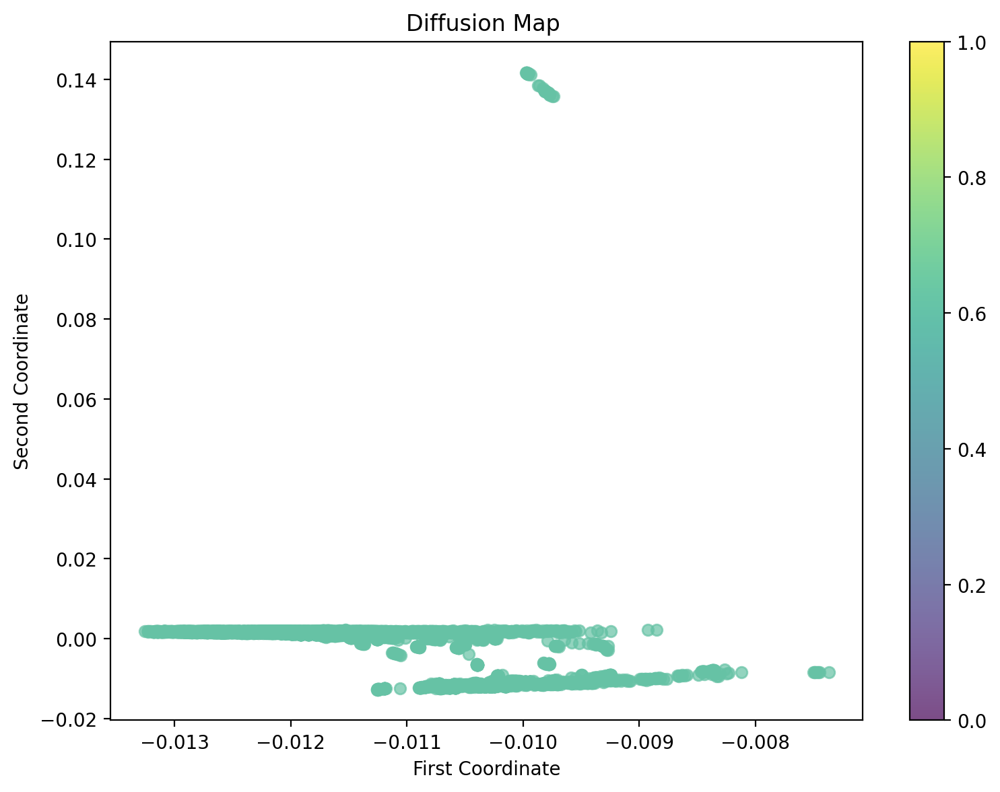

In [46]:
plt.figure(figsize=(8, 6))
plt.scatter(diffusion_coordinates[:, 0], diffusion_coordinates[:, 1], cmap='tab10', alpha=0.7)
plt.colorbar()
plt.title("Diffusion Map ")
plt.xlabel("First Coordinate")
plt.ylabel("Second Coordinate")
plt.tight_layout()
plt.show()

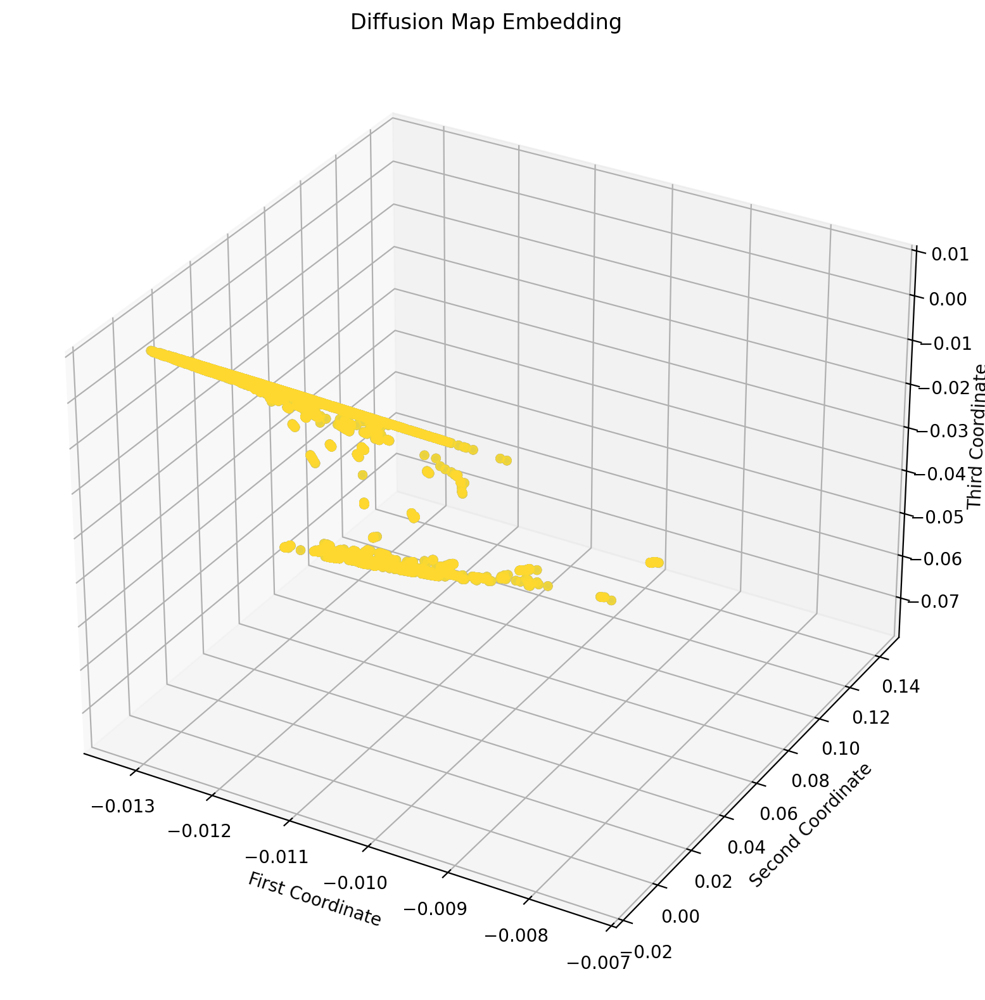

In [47]:
# plot 3D
from mpl_toolkits.mplot3d import Axes3D


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for i in range(6):
    ax.scatter(diffusion_coordinates[:, 0], diffusion_coordinates[:, 1], diffusion_coordinates[:, 2],alpha=0.7)
ax.set_title("Diffusion Map Embedding")
ax.set_xlabel("First Coordinate")
ax.set_ylabel("Second Coordinate")
ax.set_zlabel("Third Coordinate")

plt.tight_layout()
plt.show()

#### Low Dimensional Embedding

Embedded Data Shape: (7352, 3)


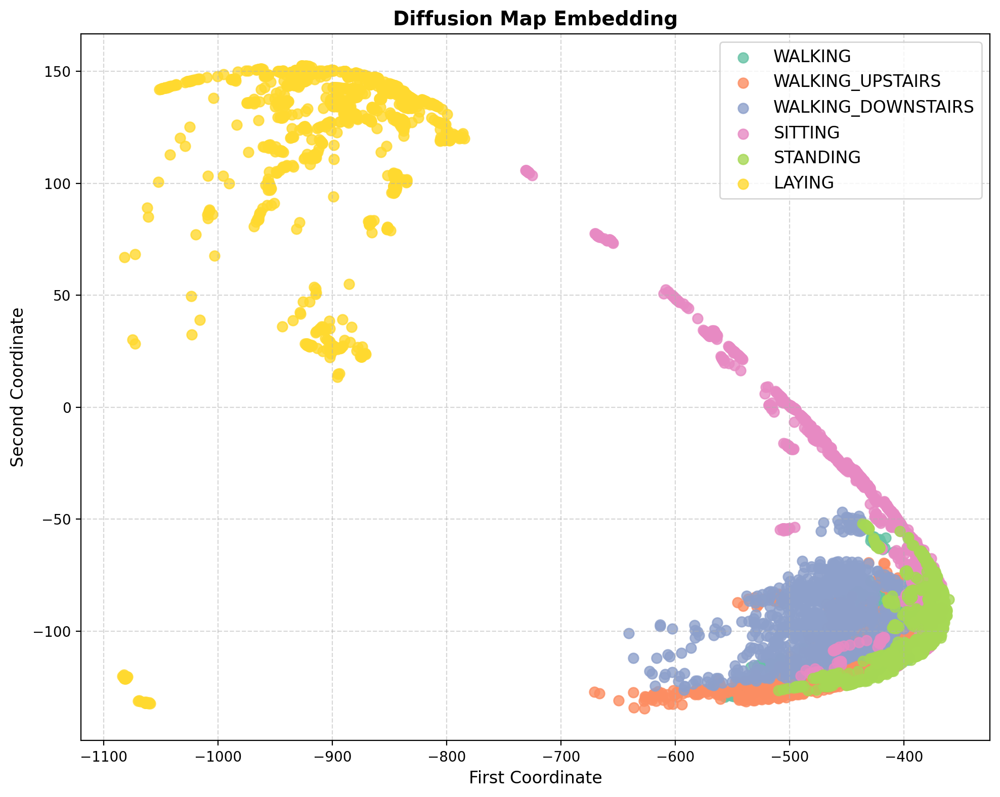

In [38]:
embedded_data = dtw_dist_matrix @ diffusion_coordinates
print("Embedded Data Shape:", embedded_data.shape)

activity = ["WALKING", "WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "SITTING", "STANDING", "LAYING"]
sns.set_palette("Set2")

plt.figure(figsize=(10, 8))
for i in range(6):
    indices = np.where(y_train == i + 1)[0]
    plt.scatter(embedded_data[indices, 0], embedded_data[indices, 1], 
                label=activity[i], s=50, alpha=0.8,  color=sns.color_palette("Set2")[i])

plt.legend(frameon=True, fontsize=12)
plt.title("Diffusion Map Embedding", fontsize=14, fontweight="bold")
plt.xlabel("First Coordinate", fontsize=12)
plt.ylabel("Second Coordinate", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

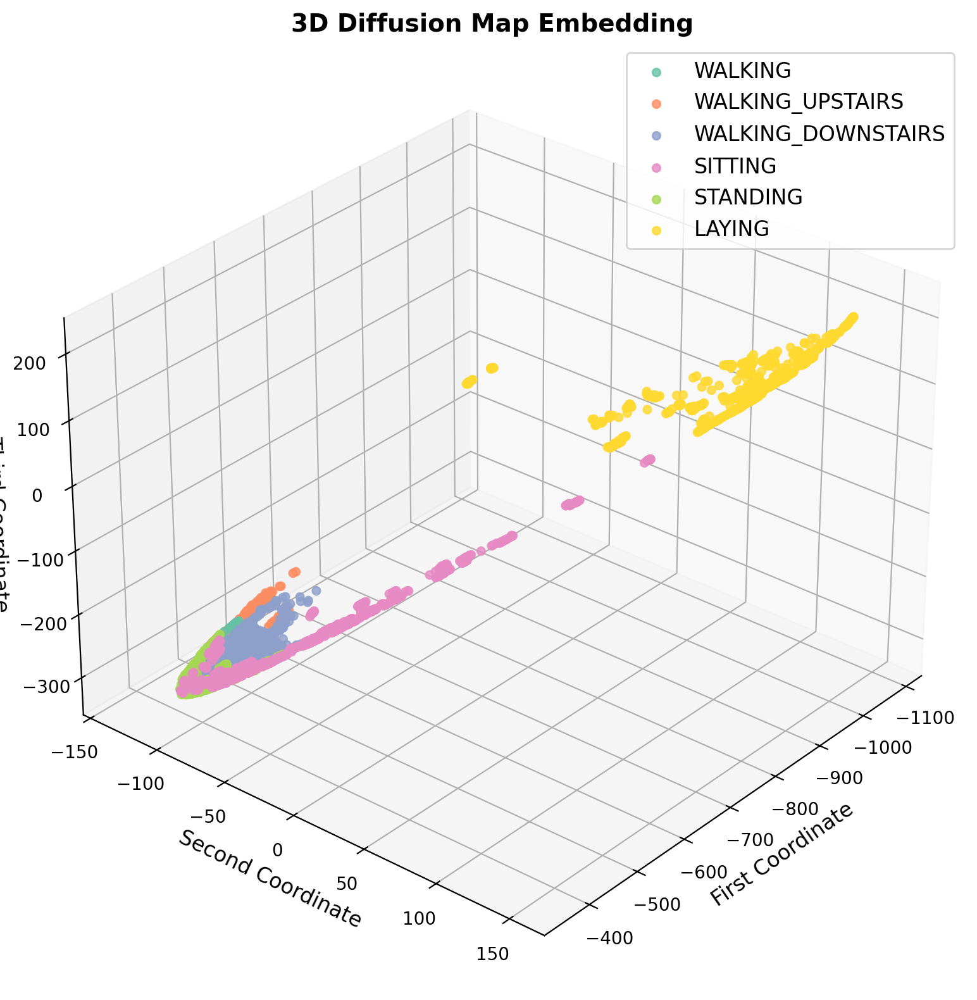

In [52]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

sns.set_palette("Set2")
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')



for i in range(6):
    indices = np.where(y_train == i + 1)[0]
    ax.scatter(embedded_data[indices, 0], 
               embedded_data[indices, 1], 
               embedded_data[indices, 2], 
               label=activity[i], alpha=0.8, color=sns.color_palette("Set2")[i])

ax.set_title("3D Diffusion Map Embedding", fontsize=14, fontweight="bold")
ax.set_xlabel("First Coordinate", fontsize=12)
ax.set_ylabel("Second Coordinate", fontsize=12)
ax.set_zlabel("Third Coordinate", fontsize=12)

ax.legend(frameon=True, fontsize=12)
ax.view_init(elev=30, azim=40) 

plt.tight_layout()
plt.show()



### Task 3 :  Clustering in the Diffusion Space

#### Apply K-Means or DBSCAN to the diffusion map embeddings.


C:\Users\Soham\AppData\Local\Temp\ipykernel_7712\1833879680.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend()


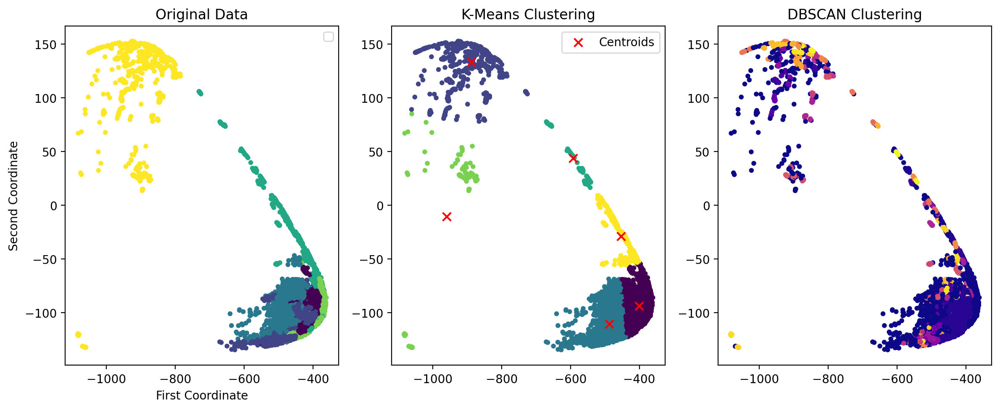

In [40]:
from sklearn.cluster import KMeans, DBSCAN

n_clusters = 6

# Apply K-Means
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(embedded_data)

# Apply DBSCAN
eps = 3 # Adjust based on the dataset (use knee plot to tune)
min_samples = 5
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
dbscan_labels = dbscan.fit_predict(embedded_data)

# Visualize Results
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

# original data
axes[0].scatter(embedded_data[:, 0], embedded_data[:, 1], c=y_train, cmap='viridis', s=10)
axes[0].set_title("Original Data")
axes[0].set_xlabel("First Coordinate")
axes[0].set_ylabel("Second Coordinate")
axes[0].legend()

# K-Means Clustering Plot
axes[1].scatter(embedded_data[:, 0], embedded_data[:, 1], c=kmeans_labels, cmap='viridis', s=10)
axes[1].scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', marker='x', s=50, label="Centroids")
axes[1].set_title("K-Means Clustering")
axes[1].legend()

# DBSCAN Clustering Plot
axes[2].scatter(embedded_data[:, 0], embedded_data[:, 1], c=dbscan_labels, cmap='plasma', s=10)
axes[2].set_title("DBSCAN Clustering")

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import adjusted_rand_score, silhouette_score


# Assuming true labels exist (replace with actual labels)
true_labels = y_train 

# Compute Adjusted Rand Index (ARI)
ari_kmeans = adjusted_rand_score(true_labels, kmeans_labels)
ari_dbscan = adjusted_rand_score(true_labels, dbscan_labels)

# Compute Silhouette Score (DBSCAN might fail if only one cluster or too much noise)
silhouette_kmeans = silhouette_score(embedded_data, kmeans_labels)

# Ensure DBSCAN has valid labels (at least 2 clusters required for silhouette score)
if len(set(dbscan_labels)) > 1:
    silhouette_dbscan = silhouette_score(embedded_data, dbscan_labels)
else:
    silhouette_dbscan = -1  # Not computable

# Print evaluation metrics
print(f"K-Means ARI: {ari_kmeans:.4f}, Silhouette Score: {silhouette_kmeans:.4f}")
print(f"DBSCAN ARI: {ari_dbscan:.4f}, Silhouette Score: {silhouette_dbscan:.4f}")


K-Means ARI: 0.3062, Silhouette Score: 0.5086
DBSCAN ARI: 0.1953, Silhouette Score: -0.1847


#### Visualization and Interpretation

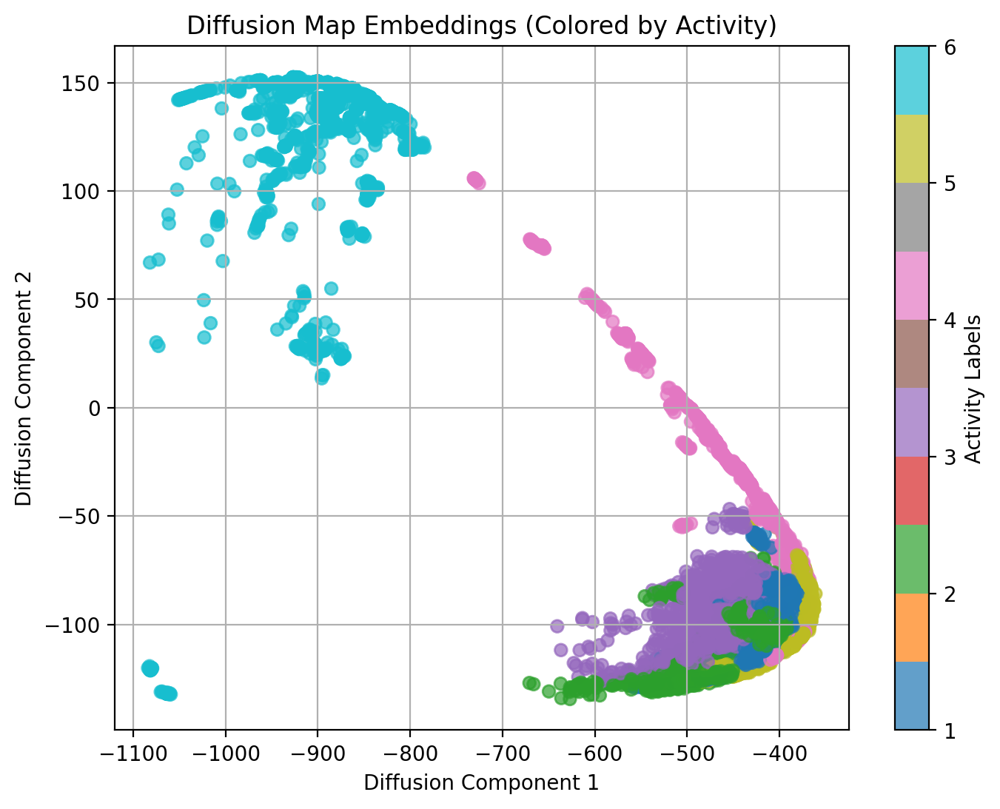

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import adjusted_rand_score, silhouette_score


# Step 1: Scatter Plot of Diffusion Embeddings
plt.figure(figsize=(8, 6))
scatter = plt.scatter(embedded_data[:, 0], embedded_data[:, 1], c=y_train, cmap='tab10', alpha=0.7)
plt.colorbar(scatter, label="Activity Labels")
plt.title("Diffusion Map Embeddings (Colored by Activity)")
plt.xlabel("Diffusion Component 1")
plt.ylabel("Diffusion Component 2")
plt.grid(True)
plt.show()


### Task 4

In [43]:
X_train = np.concatenate((x_signals, y_signals, z_signals), axis=1)
raw_features = X_train

print("Raw Features Shape:", raw_features.shape)

n_clusters = 6

# Step 3: Evaluate Clustering Quality
def evaluate_clustering(true_labels, predicted_labels, method_name):
    ari = adjusted_rand_score(true_labels, predicted_labels)
    silhouette = silhouette_score(raw_features, predicted_labels)  # Use raw features for silhouette
    print(f"{method_name}: ARI = {ari:.3f}, Silhouette Score = {silhouette:.3f}")

print("\nClustering Performance Comparison:")

# Raw feature space
kmeans_raw = KMeans(n_clusters=n_clusters, random_state=42).fit(raw_features)
labels_raw = kmeans_raw.labels_

# PCA-reduced space
pca = PCA(n_components=2)
pca_data = pca.fit_transform(raw_features)
kmeans_pca = KMeans(n_clusters=n_clusters, random_state=42).fit(pca_data)
labels_pca = kmeans_pca.labels_

# t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_data = tsne.fit_transform(raw_features)
kmeans_tsne = KMeans(n_clusters=n_clusters, random_state=42).fit(tsne_data)
labels_tsne = kmeans_tsne.labels_

# Diffusion Map space
kmeans_diff = KMeans(n_clusters=n_clusters, random_state=42).fit(embedded_data)
labels_diff = kmeans_diff.labels_

evaluate_clustering(y_train, labels_raw, "Raw Features")
evaluate_clustering(y_train, labels_pca, "PCA")
evaluate_clustering(y_train, labels_tsne, "t-SNE")
evaluate_clustering(y_train, labels_diff, "Diffusion Maps")

Raw Features Shape: (7352, 192)

Clustering Performance Comparison:
Raw Features: ARI = 0.186, Silhouette Score = 0.241
PCA: ARI = 0.208, Silhouette Score = 0.181
t-SNE: ARI = 0.235, Silhouette Score = 0.118
Diffusion Maps: ARI = 0.306, Silhouette Score = 0.198


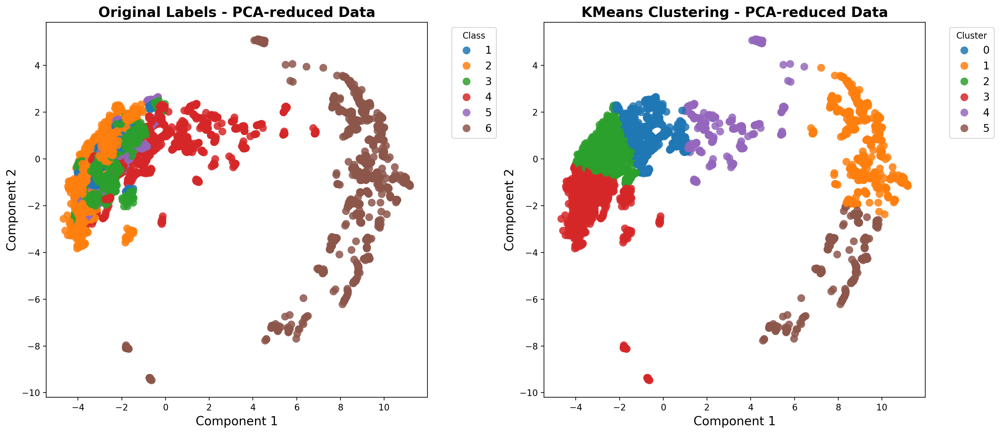

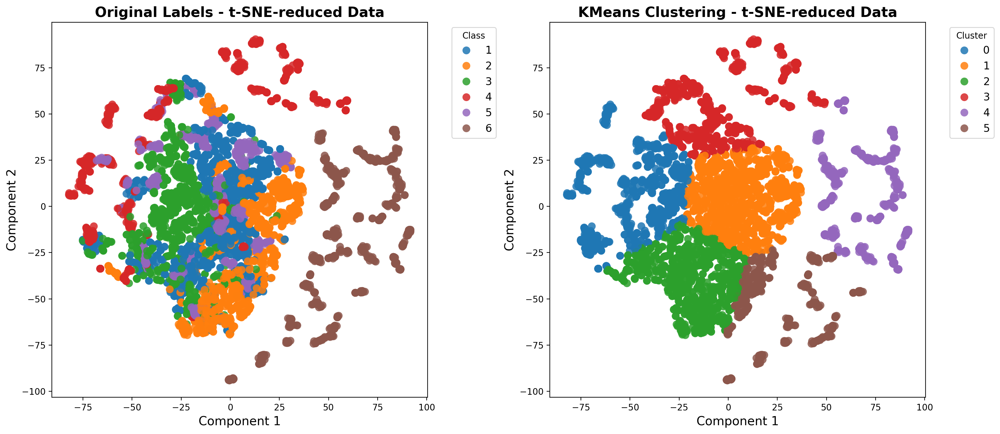

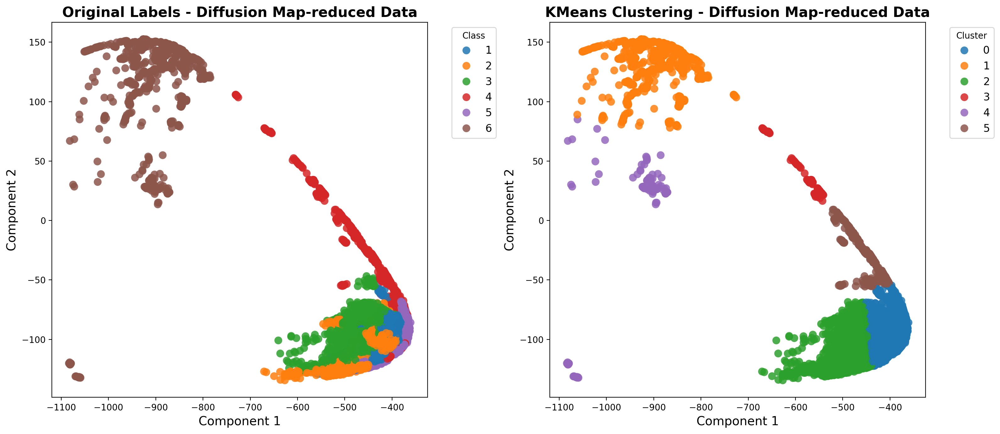

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score, silhouette_score
import seaborn as sns

# Function to plot clustering results with original data comparison
def plot_comparison(original, clustered, original_labels, clustered_labels, title):
    fig, axes = plt.subplots(1, 2, figsize=(16, 7))
    
    sns.scatterplot(x=original[:, 0], y=original[:, 1], hue=original_labels, palette='tab10', alpha=0.85, s=80, edgecolor='none', ax=axes[0])
    axes[0].set_title(f'Original Labels - {title}', fontsize=16, fontweight='bold')
    axes[0].set_xlabel('Component 1', fontsize=14)
    axes[0].set_ylabel('Component 2', fontsize=14)
    axes[0].legend(title='Class', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    
    sns.scatterplot(x=clustered[:, 0], y=clustered[:, 1], hue=clustered_labels, palette='tab10', alpha=0.85, s=80, edgecolor='none', ax=axes[1])
    axes[1].set_title(f'KMeans Clustering - {title}', fontsize=16, fontweight='bold')
    axes[1].set_xlabel('Component 1', fontsize=14)
    axes[1].set_ylabel('Component 2', fontsize=14)
    axes[1].legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    
    plt.tight_layout()
    plt.show()

# PCA Visualization
plot_comparison(pca_data, pca_data, y_train, labels_pca, 'PCA-reduced Data')

# t-SNE Visualization
plot_comparison(tsne_data, tsne_data, y_train, labels_tsne, 't-SNE-reduced Data')

# Diffusion Maps Visualization
plot_comparison(embedded_data, embedded_data, y_train, labels_diff, 'Diffusion Map-reduced Data')


Short Report explaining the choice of distance metric and why Diffusion Maps outperform PCA/t
SNE.